# CS180 Project 3

Date: 10/8/25

# Table of Contents

- [Part 3A](#part-3A)
  - [A.1](#A1)
  - [A.2](#12)
  - [A.3](#13)
  - [A.4](#14)
- [Part 2](#part-2)
  - [2.1](#21)
  - [2.2](#22)

Imports and helpful functions

In [1]:
import numpy as np
# Fix matplotlib backend issues
# import matplotlib
# matplotlib.use('Agg')  # Use non-GUI backend
import matplotlib.pyplot as plt
import scipy
import skimage as sk
import skimage.io as skio
import scipy
import sys
#import cv2
import os

def save_output_im(im_out, fname):  
    """Saves an image and outputs it

    Inputs:
        im_out: Stacked image in (H x W x 3) (r g b)
        fname name of file
    """
    # save the image
    fname = f'../images/{fname}.jpg'
    if im_out.dtype == np.float64:
        im_out = (im_out * 255).astype(np.uint8)
    else:
        raise ValueError(f"Invalid image type {im_out.dtype}")
    skio.imsave(fname,im_out, as_gray = True)
    

### Part 3A

#### A.1

I will try to recreate the view from my desk in a panorama, and also took a panorama for control

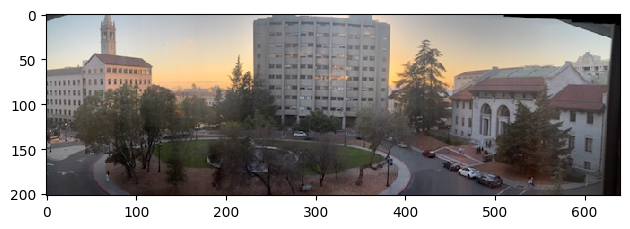

In [4]:
panorama = skio.imread('../images/IMG_5841.jpg')
skio.imshow(panorama)

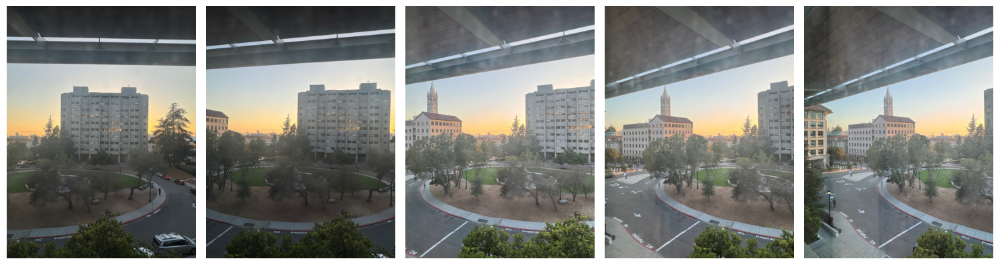

In [8]:
image_list = []
image_dir = '../images'
for fname in os.listdir(image_dir):
    if fname.endswith('.jpg') and fname != 'IMG_5841.jpg':
        img = skio.imread(os.path.join(image_dir, fname))
        # Rotate the image by 90 degrees clockwise
        img_rotated = np.rot90(img, k=-1)
        image_list.append(img_rotated)
        
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for i in range(5):
    axes[i].imshow(image_list[i])
    axes[i].axis('off')
plt.tight_layout()
plt.show()

#### A.2

In [179]:
def computeH(im1_pts, im2_pts):
    """ Return the transformation matrix H for transforming im1 to im2
        Assumes the points are correspondent (i.e im1_pts[0] is the same point in im2_pts[0])
    Args:
        im1_pts (2D array): nx2 array of correspondent points for im1. Assume this is our base (x,y)
        im1_pts (2D array): nx2 array of correspondent points for im2. Assume this is our transformed (u,v)
    """
    H = np.zeros(shape = (8))
    
    assert(len(im1_pts) > 3 and len(im2_pts) > 3), "Need at least 4 correspondent points!"
    assert(im1_pts.shape == im2_pts.shape), "Both arrays must be the same shape!"
    
    A = np.zeros(shape = (int(im1_pts.shape[0] * 2),8))
    #print(A.shape[-2:])
    b = np.zeros(shape = (int(im2_pts.shape[0] * 2)))
    for i in range(len(im1_pts)):
        #Fill in one correspondent 
        a0 = [im1_pts[i][0], im1_pts[i][1], 1, 0, 0, 0, -im2_pts[i][0] * im1_pts[i][0], -im2_pts[i][0] * im1_pts[i][1]]
        a1 = [0, 0, 0, im1_pts[i][0], im1_pts[i][1], 1,  -im2_pts[i][1] * im1_pts[i][0], -im2_pts[i][1] * im1_pts[i][1]]
        A[2*i] , A[2* i + 1], b[2*i], b[2*i + 1] = a0, a1, im2_pts[i][0], im2_pts[i][1]
    
    H = np.linalg.lstsq(A, b)
    H = H[0]
    H = np.append(H,1)
    H = H.reshape(3,3)    
    return H

Recover homographies

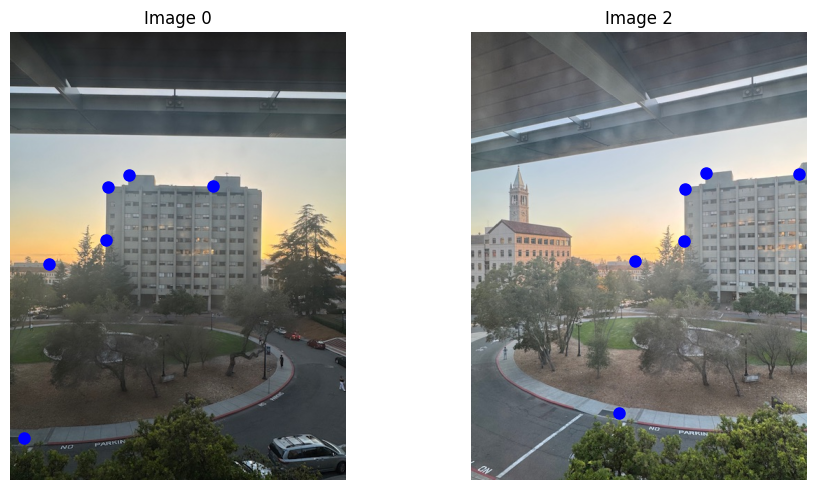

In [ ]:
import json

with open('../images/IMG_5832_IMG_5835.json', 'r') as f:
    correspondences = json.load(f)
    
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
x1p = np.array(correspondences['im1Points'])[:,0]
y1p = np.array(correspondences['im1Points'])[:,1]
x2p = np.array(correspondences['im2Points'])[:,0]
y2p = np.array(correspondences['im2Points'])[:,1]
axes[0].imshow(image_list[0])
axes[0].axis('off')
axes[0].set_title('Image 0')
axes[0].plot(x1p,y1p, 'bo', markersize = 8, label = 'Multiple points')
axes[1].imshow(image_list[2])
axes[1].axis('off')
axes[1].set_title('Image 2')
axes[1].plot(x2p,y2p, 'bo', markersize = 8, label = 'Multiple points')
plt.tight_layout()
plt.show()

In [248]:
#set correspondent points
panH = computeH(np.array(correspondences['im1Points']),np.array(correspondences['im2Points']))
panH

array([[ 5.71100148e-01,  3.13770620e-02,  1.87975122e+02],
       [-2.74463231e-01,  9.12438766e-01,  3.52833705e+01],
       [-8.60347724e-04,  7.81272190e-05,  1.00000000e+00]])

#### A.3

In [183]:
def applyTransform(im,H):
    H_inv = np.linalg.inv(H)
    
    h_in, w_in = im.shape[:2]
    corners = np.array([
        [0, w_in-1, w_in-1, 0],
        [0, 0, h_in-1, h_in-1],
        [1, 1, 1, 1]
    ])
    
    transformed_corners = H @ corners
    transformed_corners = transformed_corners / transformed_corners[2, :]
    
    min_x = int(np.floor(np.min(transformed_corners[0, :])))
    max_x = int(np.ceil(np.max(transformed_corners[0, :])))
    min_y = int(np.floor(np.min(transformed_corners[1, :])))
    max_y = int(np.ceil(np.max(transformed_corners[1, :])))
    
    x_coord, y_coord = np.meshgrid(np.arange(min_x, max_x), np.arange(min_y, max_y))
    x_coord = x_coord.ravel()
    y_coord = y_coord.ravel()
    ones = np.ones_like(x_coord)
    
    stacked = np.stack([x_coord, y_coord, ones])
    
    im_out = H_inv @ stacked
    im_out = im_out / im_out[2, :]
    
    return stacked, im_out

In [252]:
def warpImageNearestNeighbor(im, H):
    final_coords, sample_coords = applyTransform(im, H)

    h_out = int(np.max(final_coords[1, :]) - np.min(final_coords[1, :]))
    w_out = int(np.max(final_coords[0, :]) - np.min(final_coords[0, :]))

    # Allocate output with the right shape and dtype (handles grayscale or RGB/RGBA)
    if len(im.shape) == 3:
        im_out = np.zeros((h_out, w_out, im.shape[2]), dtype=im.dtype)
    else:
        im_out = np.zeros((h_out, w_out), dtype=im.dtype)

    offset_x = int(np.min(final_coords[0, :]))
    offset_y = int(np.min(final_coords[1, :]))

    for i in range(final_coords.shape[1]):
        u = int(final_coords[0, i] - offset_x)
        v = int(final_coords[1, i] - offset_y)

        # Nearest neighbor in source image
        x = int(np.round(sample_coords[0, i]))
        y = int(np.round(sample_coords[1, i]))

        if 0 <= u < w_out and 0 <= v < h_out and 0 <= x < im.shape[1] and 0 <= y < im.shape[0]:
            im_out[v, u] = im[y, x]

    return im_out

In [253]:
def warpImageBilinear(im, H):
    final_coords, sample_coords = applyTransform(im, H)
    
    h_out = int(np.max(final_coords[1,:]) - np.min(final_coords[1,:]))
    w_out = int(np.max(final_coords[0,:]) - np.min(final_coords[0,:]))
    
    if len(im.shape) == 3:
        im_out = np.zeros((h_out, w_out, im.shape[2]))
    else:
        im_out = np.zeros((h_out, w_out))
    
    offset_x = int(np.min(final_coords[0,:]))
    offset_y = int(np.min(final_coords[1,:]))
    
    for i in range(final_coords.shape[1]):
        u, v = int(final_coords[0, i] - offset_x), int(final_coords[1, i] - offset_y)
        x, y = sample_coords[0, i], sample_coords[1, i]
        
        x0, y0 = int(np.floor(x)), int(np.floor(y))
        x1, y1 = x0 + 1, y0 + 1
        
        if 0 <= x0 < im.shape[1]-1 and 0 <= y0 < im.shape[0]-1 and 0 <= u < w_out and 0 <= v < h_out:
            wx = x - x0
            wy = y - y0
            
            bl = im[y0, x0] * (1 - wx) * (1 - wy)
            br = im[y0, x1] * wx * (1 - wy)
            tl = im[y1, x0] * (1 - wx) * wy
            tr = im[y1, x1] * wx * wy
            
            im_out[v, u] = bl + br + tl + tr
    
    return im_out

Tests to verify functions are working properly

=== TEST 1: Translation ===


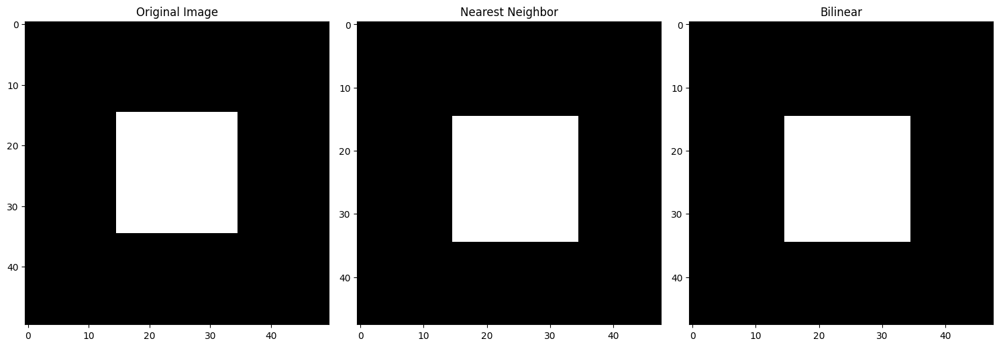

Original shape: (50, 50)
Output shape: (48, 48)
Should see white square shifted right and down

=== TEST 2: Rotation + Scale ===


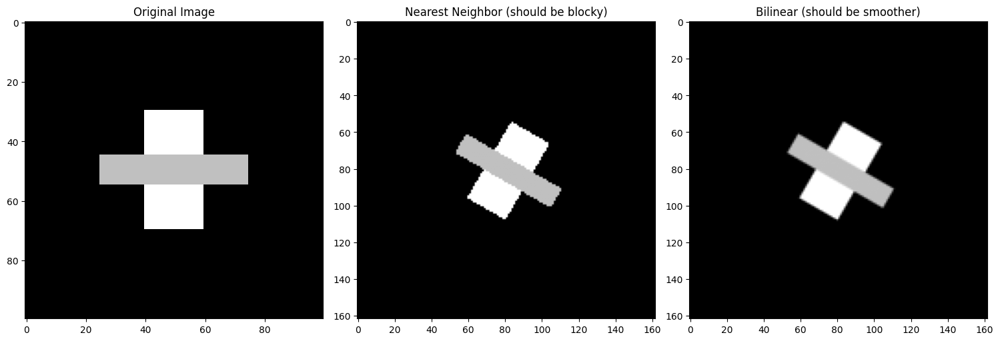

Original shape: (100, 100)
Output shape: (162, 162)
Nearest neighbor should look more blocky/jagged
Bilinear should look smoother



In [186]:
# Simple Test Case: Translation
def test_translation():
    print("=== TEST 1: Translation ===")
    # Create a simple test image with a white square on black background
    im = np.zeros((50, 50))
    im[15:35, 15:35] = 255  # White square in the middle
    
    # Translation matrix: shift right by 10, down by 5
    H = np.array([[1, 0, 10],
                  [0, 1, 5],
                  [0, 0, 1]], dtype=float)
    
    # Test nearest neighbor
    result_nn = warpImageNearestNeighbor(im, H)
    
    # Test bilinear
    result_bi = warpImageBilinear(im, H)
    
    # Visualize
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(im, cmap='gray')
    axes[0].set_title('Original Image')
    axes[1].imshow(result_nn, cmap='gray')
    axes[1].set_title('Nearest Neighbor')
    axes[2].imshow(result_bi, cmap='gray')
    axes[2].set_title('Bilinear')
    plt.tight_layout()
    plt.show()
    
    print(f"Original shape: {im.shape}")
    print(f"Output shape: {result_nn.shape}")
    print("Should see white square shifted right and down\n")


# Hard Test Case: Rotation + Scale
def test_rotation_scale():
    print("=== TEST 2: Rotation + Scale ===")
    # Create a more complex test image
    im = np.zeros((100, 100))
    # Draw a simple pattern
    im[30:70, 40:60] = 200  # Vertical rectangle
    im[45:55, 25:75] = 150  # Horizontal stripe
    
    # 30-degree rotation + scale by 1.2
    theta = np.pi / 6  # 30 degrees
    scale = 1.2
    cos_t = np.cos(theta)
    sin_t = np.sin(theta)
    
    # Rotation around center of image
    cx, cy = 50, 50
    
    # Combined transformation: translate to origin, rotate+scale, translate back
    T1 = np.array([[1, 0, -cx],
                   [0, 1, -cy],
                   [0, 0, 1]], dtype=float)
    
    R_S = np.array([[scale * cos_t, -scale * sin_t, 0],
                    [scale * sin_t,  scale * cos_t, 0],
                    [0,              0,              1]], dtype=float)
    
    T2 = np.array([[1, 0, cx],
                   [0, 1, cy],
                   [0, 0, 1]], dtype=float)
    
    H = T2 @ R_S @ T1
    
    # Test both methods
    result_nn = warpImageNearestNeighbor(im, H)
    result_bi = warpImageBilinear(im, H)
    
    # Visualize
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(im, cmap='gray')
    axes[0].set_title('Original Image')
    axes[1].imshow(result_nn, cmap='gray')
    axes[1].set_title('Nearest Neighbor (should be blocky)')
    axes[2].imshow(result_bi, cmap='gray')
    axes[2].set_title('Bilinear (should be smoother)')
    plt.tight_layout()
    plt.show()
    
    print(f"Original shape: {im.shape}")
    print(f"Output shape: {result_nn.shape}")
    print("Nearest neighbor should look more blocky/jagged")
    print("Bilinear should look smoother\n")


# Run tests
test_translation()
test_rotation_scale()

=== TEST 3: Small Image Rotation ===


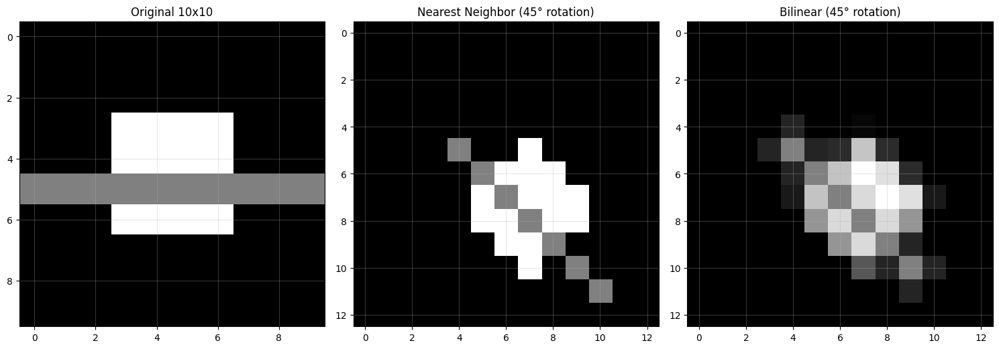

Original shape: (10, 10)
Output shape: (13, 13)
Output should be larger to fit rotated image

=== TEST 4: Scaling Only ===


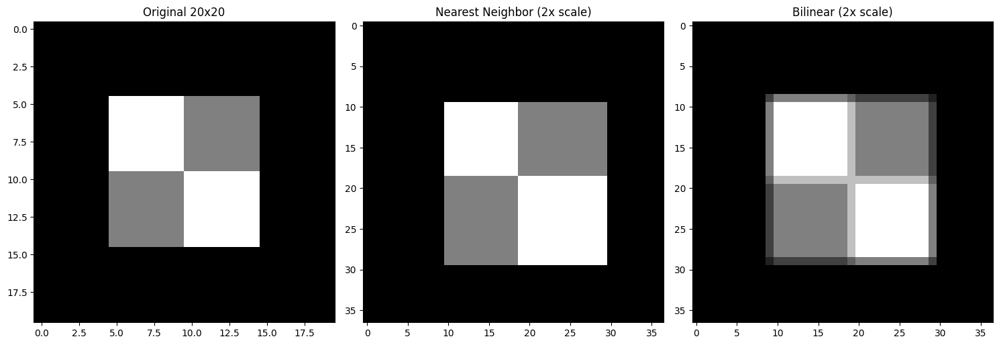

Original shape: (20, 20)
Output shape: (37, 37)
Output should be roughly 2x larger (40x40)

=== TEST 5: Scale Down ===


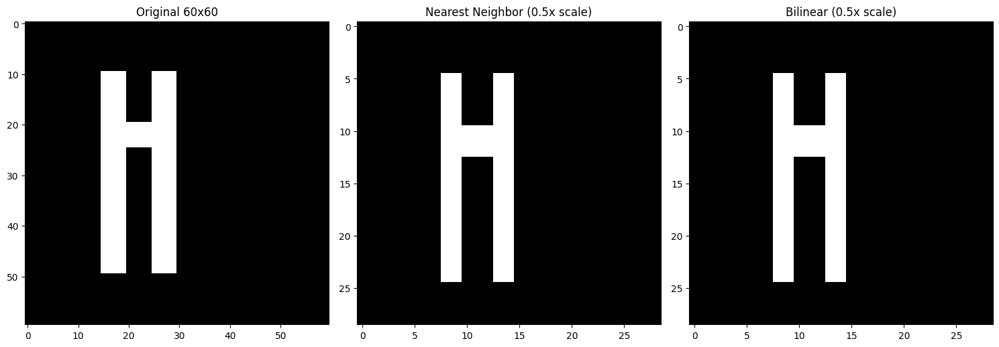

Original shape: (60, 60)
Output shape: (29, 29)
Output should be roughly half size (30x30)

=== TEST 6: Non-uniform Scaling ===


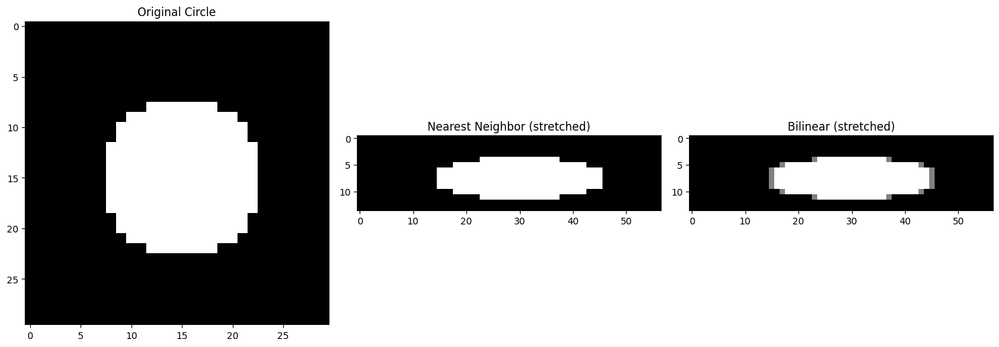

Original shape: (30, 30)
Output shape: (14, 57)
Circle should become an ellipse (wider, shorter)

=== TEST 7: Small Image - Rotate + Scale ===


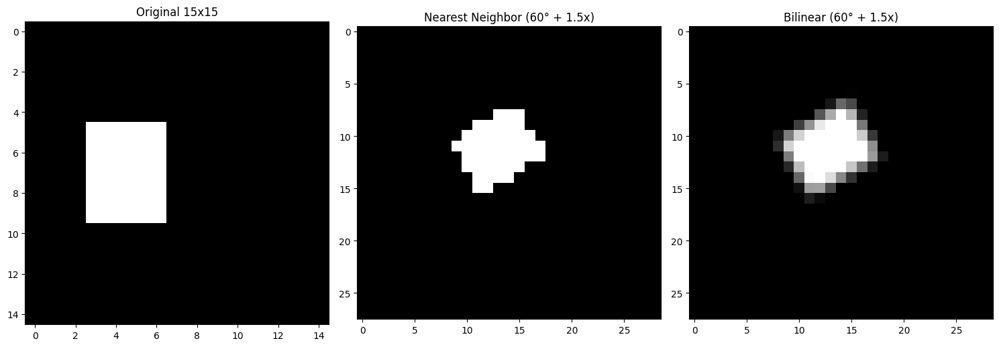

Original shape: (15, 15)
Output shape: (28, 29)
Should see rotated and enlarged rectangle



In [205]:
def test_small_rotation():
    """Test rotation on a very small image to see exact pixel changes"""
    print("=== TEST 3: Small Image Rotation ===")
    
    # Tiny 10x10 image with a pattern
    im = np.zeros((10, 10))
    im[3:7, 3:7] = 255  # Small white square
    im[5, :] = 128  # Gray horizontal line through middle
    
    # 45-degree rotation around center
    theta = np.pi / 4
    cx, cy = 5, 5
    
    cos_t = np.cos(theta)
    sin_t = np.sin(theta)
    
    T1 = np.array([[1, 0, -cx],
                   [0, 1, -cy],
                   [0, 0, 1]], dtype=float)
    
    R = np.array([[cos_t, -sin_t, 0],
                  [sin_t,  cos_t, 0],
                  [0,      0,      1]], dtype=float)
    
    T2 = np.array([[1, 0, cx],
                   [0, 1, cy],
                   [0, 0, 1]], dtype=float)
    
    H = T2 @ R @ T1
    
    result_nn = warpImageNearestNeighbor(im, H)
    result_bi = warpImageBilinear(im, H)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(im, cmap='gray', interpolation='nearest')
    axes[0].set_title('Original 10x10')
    axes[0].grid(True, alpha=0.3)
    axes[1].imshow(result_nn, cmap='gray', interpolation='nearest')
    axes[1].set_title('Nearest Neighbor (45° rotation)')
    axes[1].grid(True, alpha=0.3)
    axes[2].imshow(result_bi, cmap='gray', interpolation='nearest')
    axes[2].set_title('Bilinear (45° rotation)')
    axes[2].grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print(f"Original shape: {im.shape}")
    print(f"Output shape: {result_nn.shape}")
    print("Output should be larger to fit rotated image\n")


def test_scaling_only():
    """Test pure scaling transformation"""
    print("=== TEST 4: Scaling Only ===")
    
    # Small image with checkerboard pattern
    im = np.zeros((20, 20))
    im[5:10, 5:10] = 200
    im[10:15, 10:15] = 200
    im[5:10, 10:15] = 100
    im[10:15, 5:10] = 100
    
    # Scale by 2x in both directions
    H_scale_up = np.array([[2, 0, 0],
                           [0, 2, 0],
                           [0, 0, 1]], dtype=float)
    
    result_nn = warpImageNearestNeighbor(im, H_scale_up)
    result_bi = warpImageBilinear(im, H_scale_up)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(im, cmap='gray')
    axes[0].set_title('Original 20x20')
    axes[1].imshow(result_nn, cmap='gray')
    axes[1].set_title('Nearest Neighbor (2x scale)')
    axes[2].imshow(result_bi, cmap='gray')
    axes[2].set_title('Bilinear (2x scale)')
    plt.tight_layout()
    plt.show()
    
    print(f"Original shape: {im.shape}")
    print(f"Output shape: {result_nn.shape}")
    print("Output should be roughly 2x larger (40x40)\n")


def test_scale_down():
    """Test scaling down (shrinking)"""
    print("=== TEST 5: Scale Down ===")
    
    # Larger image with text-like pattern
    im = np.zeros((60, 60))
    im[10:50, 15:20] = 255  # Vertical bar
    im[10:50, 25:30] = 255  # Vertical bar
    im[20:25, 15:30] = 255  # Horizontal connector
    
    # Scale by 0.5x (shrink to half size)
    H_scale_down = np.array([[0.5, 0, 0],
                             [0, 0.5, 0],
                             [0, 0, 1]], dtype=float)
    
    result_nn = warpImageNearestNeighbor(im, H_scale_down)
    result_bi = warpImageBilinear(im, H_scale_down)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(im, cmap='gray')
    axes[0].set_title('Original 60x60')
    axes[1].imshow(result_nn, cmap='gray')
    axes[1].set_title('Nearest Neighbor (0.5x scale)')
    axes[2].imshow(result_bi, cmap='gray')
    axes[2].set_title('Bilinear (0.5x scale)')
    plt.tight_layout()
    plt.show()
    
    print(f"Original shape: {im.shape}")
    print(f"Output shape: {result_nn.shape}")
    print("Output should be roughly half size (30x30)\n")


def test_non_uniform_scaling():
    """Test different scaling in x and y"""
    print("=== TEST 6: Non-uniform Scaling ===")
    
    im = np.zeros((30, 30))
    # Draw a circle (roughly)
    for i in range(30):
        for j in range(30):
            if (i-15)**2 + (j-15)**2 < 64:
                im[i, j] = 255
    
    # Scale x by 2, y by 0.5
    H_stretch = np.array([[2, 0, 0],
                          [0, 0.5, 0],
                          [0, 0, 1]], dtype=float)
    
    result_nn = warpImageNearestNeighbor(im, H_stretch)
    result_bi = warpImageBilinear(im, H_stretch)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(im, cmap='gray')
    axes[0].set_title('Original Circle')
    axes[1].imshow(result_nn, cmap='gray')
    axes[1].set_title('Nearest Neighbor (stretched)')
    axes[2].imshow(result_bi, cmap='gray')
    axes[2].set_title('Bilinear (stretched)')
    plt.tight_layout()
    plt.show()
    
    print(f"Original shape: {im.shape}")
    print(f"Output shape: {result_nn.shape}")
    print("Circle should become an ellipse (wider, shorter)\n")


def test_combined_small():
    """Test rotation + scale on small image"""
    print("=== TEST 7: Small Image - Rotate + Scale ===")
    
    im = np.zeros((15, 15))
    im[5:10, 3:7] = 255  # Small rectangle
    
    # Rotate 60° and scale by 1.5
    theta = np.pi / 3  # 60 degrees
    scale = 1.5
    cx, cy = 7.5, 7.5
    
    cos_t = np.cos(theta)
    sin_t = np.sin(theta)
    
    T1 = np.array([[1, 0, -cx],
                   [0, 1, -cy],
                   [0, 0, 1]], dtype=float)
    
    R_S = np.array([[scale * cos_t, -scale * sin_t, 0],
                    [scale * sin_t,  scale * cos_t, 0],
                    [0,              0,              1]], dtype=float)
    
    T2 = np.array([[1, 0, cx],
                   [0, 1, cy],
                   [0, 0, 1]], dtype=float)
    
    H = T2 @ R_S @ T1
    
    result_nn = warpImageNearestNeighbor(im, H)
    result_bi = warpImageBilinear(im, H)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(im, cmap='gray', interpolation='nearest')
    axes[0].set_title('Original 15x15')
    axes[1].imshow(result_nn, cmap='gray', interpolation='nearest')
    axes[1].set_title('Nearest Neighbor (60° + 1.5x)')
    axes[2].imshow(result_bi, cmap='gray', interpolation='nearest')
    axes[2].set_title('Bilinear (60° + 1.5x)')
    plt.tight_layout()
    plt.show()
    
    print(f"Original shape: {im.shape}")
    print(f"Output shape: {result_nn.shape}")
    print("Should see rotated and enlarged rectangle\n")


# Run all tests
test_small_rotation()
test_scaling_only()
test_scale_down()
test_non_uniform_scaling()
test_combined_small()

Attempt to rectify images

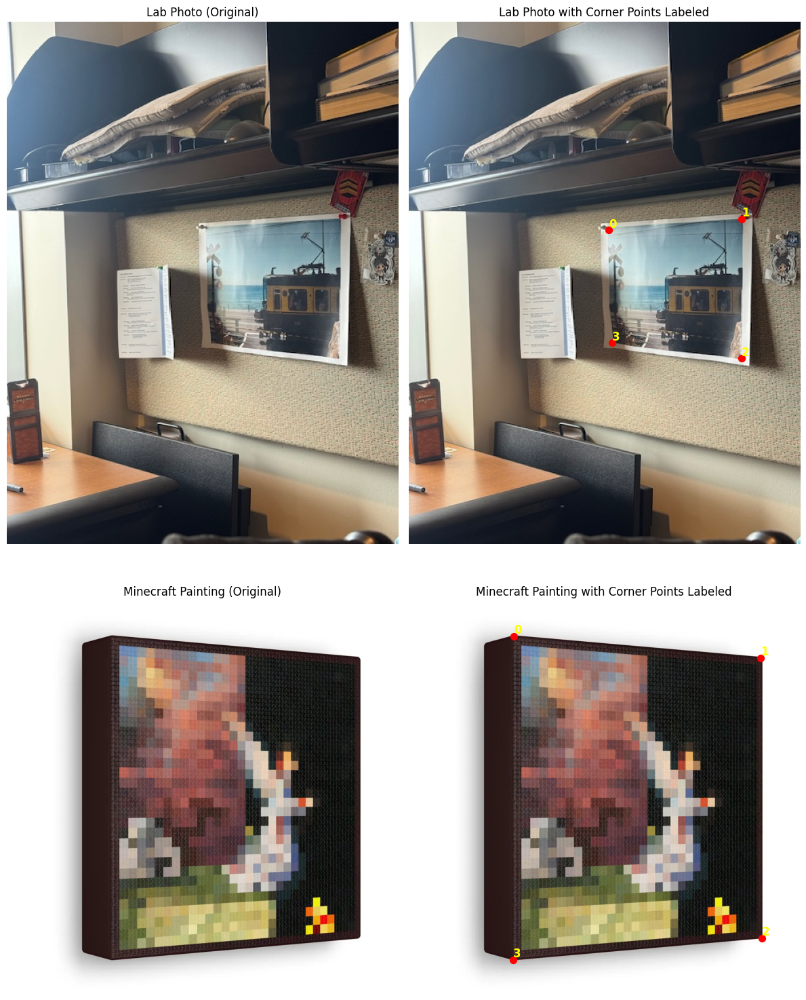

In [217]:
# Read in corners for both images

import json

with open('../images/IMG_5857_rectify.json', 'r') as f:
    lab_photo_corners = np.array(json.load(f)['im1Points'], dtype = np.float32)

with open('../images/minecraft_painting_rectify.json', 'r') as f:
    mcpaint_corners = np.array(json.load(f)['im1Points'], dtype = np.float32)
    mcpaint_corners[[2, 3]] = mcpaint_corners[[3, 2]]
    
lab_photo = np.rot90(skio.imread('../images/IMG_5857.jpg'), k=-1)
mcpaint = skio.imread('../images/minecraft_painting.webp')

fig, axes = plt.subplots(2, 2, figsize=(12, 16))

# Top left: original lab photo
axes[0,0].imshow(lab_photo)
axes[0,0].set_title('Lab Photo (Original)')
axes[0,0].axis('off')

# Top right: lab photo with corner points
axes[0,1].imshow(lab_photo)
for i, (x, y) in enumerate(lab_photo_corners):
    axes[0,1].scatter([x], [y], c='red', s=50)
    axes[0,1].text(x, y, str(i), color='yellow', fontsize=12, ha='left', va='bottom', weight='bold')
axes[0,1].set_title('Lab Photo with Corner Points Labeled')
axes[0,1].axis('off')

# Bottom left: original minecraft painting
axes[1,0].imshow(mcpaint)
axes[1,0].set_title('Minecraft Painting (Original)')
axes[1,0].axis('off')

# Bottom right: minecraft painting with corner points
axes[1,1].imshow(mcpaint)
for i, (x, y) in enumerate(mcpaint_corners):
    axes[1,1].scatter([x], [y], c='red', s=50)
    axes[1,1].text(x, y, str(i), color='yellow', fontsize=12, ha='left', va='bottom', weight='bold')
axes[1,1].set_title('Minecraft Painting with Corner Points Labeled')
axes[1,1].axis('off')

plt.tight_layout()
plt.show()

In [213]:
#solve correspondent matrices to make these images square
unit_square = np.array([[0,0], [1,0],[1,1],[0,1]])

labH = computeH(lab_photo_corners, unit_square * 200)
mcpaintH = computeH(mcpaint_corners, unit_square * 200)

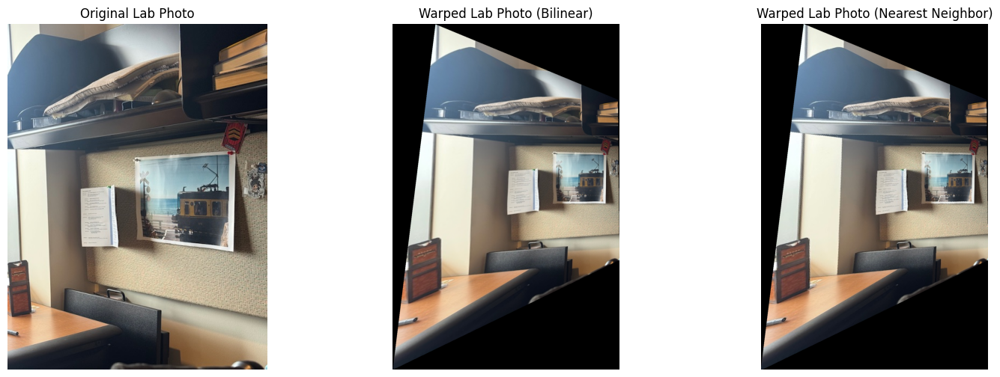

In [255]:
warped_lab_bilinear = warpImageBilinear(lab_photo, labH)
warped_lab_nearest = warpImageNearestNeighbor(lab_photo, labH)

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(lab_photo)
plt.title("Original Lab Photo")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(warped_lab_bilinear.astype(np.uint8))
plt.title("Warped Lab Photo (Bilinear)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(warped_lab_nearest.astype(np.uint8))
plt.title("Warped Lab Photo (Nearest Neighbor)")
plt.axis('off')

plt.show()

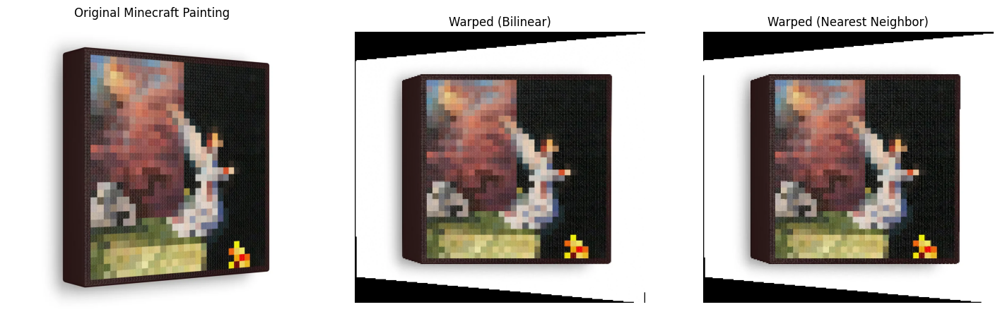

In [254]:
# Warp Minecraft painting using both bilinear and nearest neighbor interpolation

warped_mcpaint_bilinear = warpImageBilinear(mcpaint, mcpaintH)
warped_mcpaint_nearest = warpImageNearestNeighbor(mcpaint, mcpaintH)

plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(mcpaint)
plt.title("Original Minecraft Painting")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(warped_mcpaint_bilinear.astype(np.uint8))
plt.title("Warped (Bilinear)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(warped_mcpaint_nearest.astype(np.uint8))
plt.title("Warped (Nearest Neighbor)")
plt.axis('off')

plt.show()

#### A.4

Begin stitching

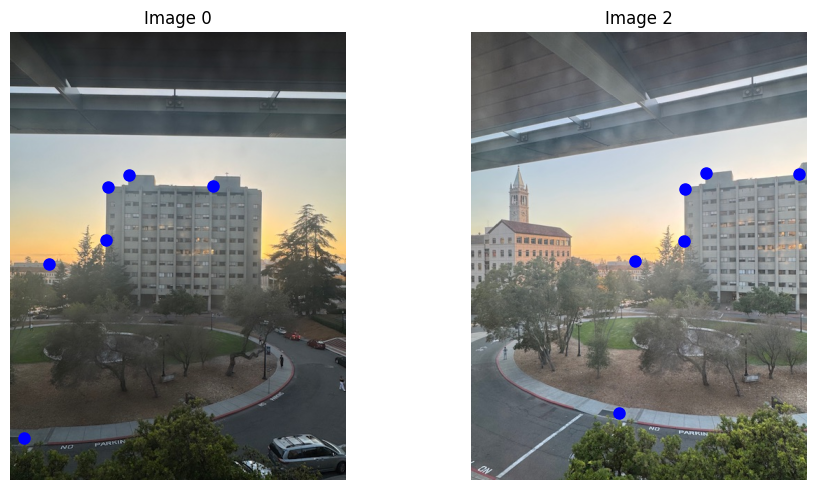

In [219]:
#recall from A.2
import json

with open('../images/IMG_5832_IMG_5835.json', 'r') as f:
    correspondences = json.load(f)
    
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
x1p = np.array(correspondences['im1Points'])[:,0]
y1p = np.array(correspondences['im1Points'])[:,1]
x2p = np.array(correspondences['im2Points'])[:,0]
y2p = np.array(correspondences['im2Points'])[:,1]
axes[0].imshow(image_list[0])
axes[0].axis('off')
axes[0].set_title('Image 0')
axes[0].plot(x1p,y1p, 'bo', markersize = 8, label = 'Multiple points')
axes[1].imshow(image_list[2])
axes[1].axis('off')
axes[1].set_title('Image 2')
axes[1].plot(x2p,y2p, 'bo', markersize = 8, label = 'Multiple points')
plt.tight_layout()
plt.show()

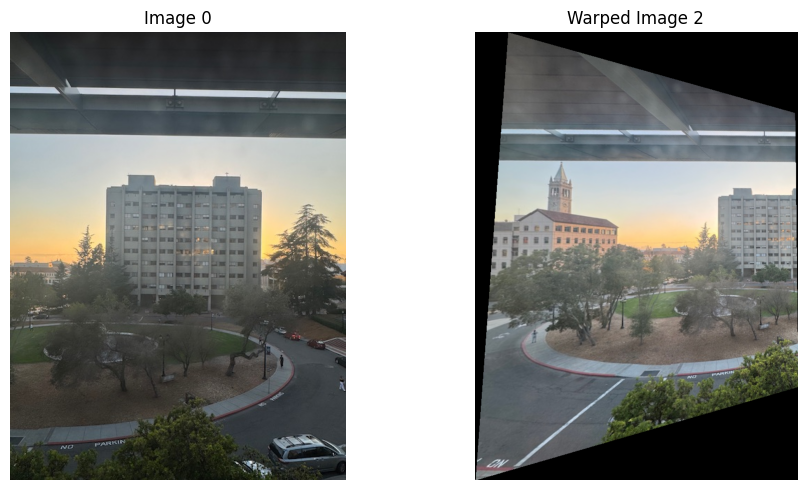

In [227]:
#compute correspondence

mH = computeH(np.array(correspondences['im2Points']), np.array(correspondences['im1Points']))
im2warped = warpImageBilinear(image_list[2], mH)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image_list[0].astype(np.uint8))
axes[0].set_title("Image 0")
axes[0].axis('off')

axes[1].imshow(im2warped.astype(np.uint8))
axes[1].set_title("Warped Image 2")
axes[1].axis('off')

plt.tight_layout()
plt.show()


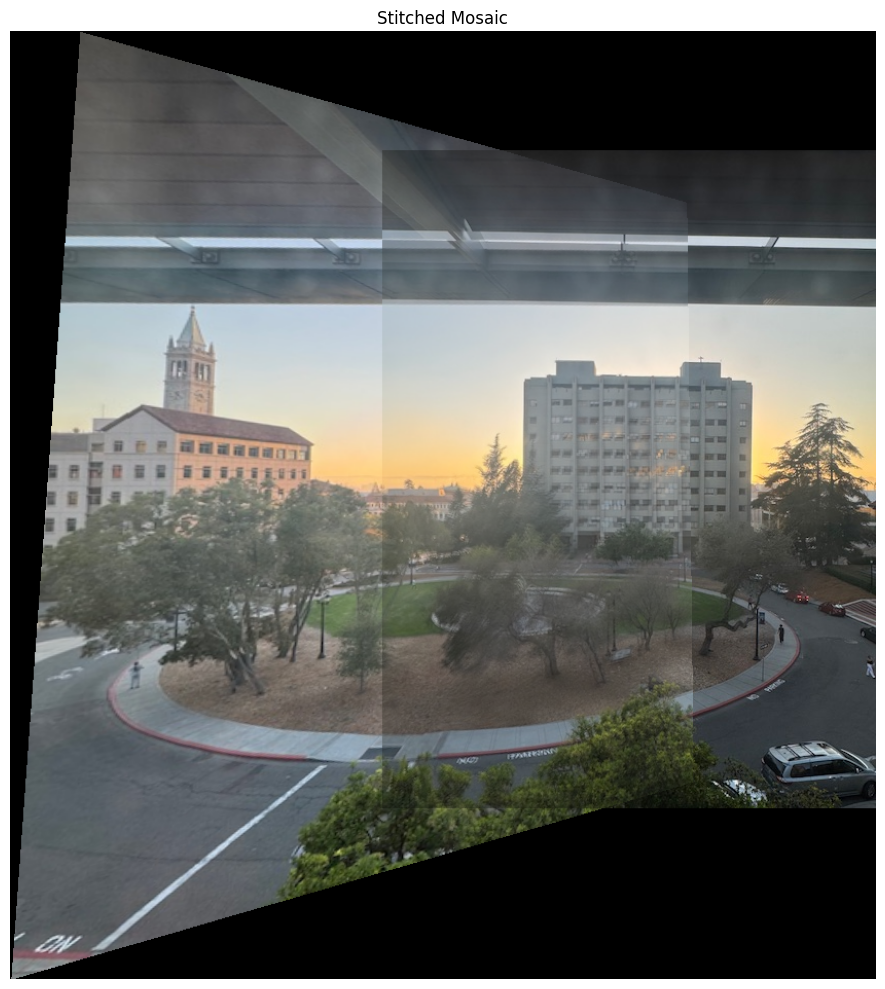

In [234]:
# Step 2: Calculate the offsets for the warped image
h2, w2 = image_list[2].shape[:2]
corners_img2 = np.array([
    [0, w2-1, w2-1, 0],
    [0, 0, h2-1, h2-1],
    [1, 1, 1, 1]
])

transformed_corners = mH @ corners_img2
transformed_corners = transformed_corners / transformed_corners[2, :]

# These are the offsets of the warped image in Image 0's coordinate system
warped_offset_x = int(np.floor(np.min(transformed_corners[0, :])))
warped_offset_y = int(np.floor(np.min(transformed_corners[1, :])))

# Step 3: Find the bounding box for the entire mosaic
h0, w0 = image_list[0].shape[:2]
hw, ww = im2warped.shape[:2]

# Image 0 corners in its own coordinate system
img0_min_x, img0_min_y = 0, 0
img0_max_x, img0_max_y = w0, h0

# Warped image corners in Image 0's coordinate system
warped_min_x = warped_offset_x
warped_min_y = warped_offset_y
warped_max_x = warped_offset_x + ww
warped_max_y = warped_offset_y + hw

# Overall bounding box
mosaic_min_x = min(img0_min_x, warped_min_x)
mosaic_min_y = min(img0_min_y, warped_min_y)
mosaic_max_x = max(img0_max_x, warped_max_x)
mosaic_max_y = max(img0_max_y, warped_max_y)

# Step 4: Create the mosaic canvas
mosaic_width = mosaic_max_x - mosaic_min_x
mosaic_height = mosaic_max_y - mosaic_min_y

mosaic = np.zeros((mosaic_height, mosaic_width, 3), dtype=np.uint8)

# Step 5: Place Image 0 in the mosaic
img0_x_in_mosaic = img0_min_x - mosaic_min_x
img0_y_in_mosaic = img0_min_y - mosaic_min_y

mosaic[img0_y_in_mosaic:img0_y_in_mosaic+h0, 
       img0_x_in_mosaic:img0_x_in_mosaic+w0] = image_list[0]

# Step 6: Place warped Image 2 in the mosaic
warped_x_in_mosaic = warped_min_x - mosaic_min_x
warped_y_in_mosaic = warped_min_y - mosaic_min_y

# Create mask for non-zero pixels in warped image
mask2 = (im2warped.sum(axis=2) > 0)

# Step 7: Blend the images
# Calculate where warped image goes in mosaic
y_start = warped_y_in_mosaic
y_end = warped_y_in_mosaic + hw
x_start = warped_x_in_mosaic
x_end = warped_x_in_mosaic + ww

# Get the region where warped image will be placed
mosaic_region = mosaic[y_start:y_end, x_start:x_end]

# Find overlap: where both images have content
mosaic_has_content = (mosaic_region.sum(axis=2) > 0)
overlap = mosaic_has_content & mask2

# Blend in overlap region (average), otherwise just place the warped image
result_region = mosaic_region.copy().astype(np.float32)
warped_float = im2warped.astype(np.float32)

# Average in overlap regions
if overlap.any():
    result_region[overlap] = (result_region[overlap] + warped_float[overlap]) / 2

# Place warped image where there's no overlap
no_overlap_mask = mask2 & ~overlap
result_region[no_overlap_mask] = warped_float[no_overlap_mask]

# Put the blended region back into mosaic
mosaic[y_start:y_end, x_start:x_end] = result_region.astype(np.uint8)

# Step 8: Display the final mosaic
plt.figure(figsize=(15, 10))
plt.imshow(mosaic)
plt.axis('off')
plt.title('Stitched Mosaic')
plt.tight_layout()
plt.show()

In [236]:
import numpy as np
from scipy.ndimage import distance_transform_edt

def align_images(img_reference, img_to_warp, homography):
    """
    Aligns two images using a homography matrix.
    
    Parameters:
    -----------
    img_reference : ndarray
        The reference image (e.g., image_list[0])
    img_to_warp : ndarray
        The image to be warped (e.g., image_list[2])
    homography : ndarray (3x3)
        Homography matrix that transforms img_to_warp to img_reference's coordinate system
    
    Returns:
    --------
    dict with keys:
        'warped_img': The warped version of img_to_warp
        'mosaic_shape': Tuple (height, width) of the output mosaic
        'img_ref_offset': Tuple (y_offset, x_offset) where reference image should be placed
        'img_warped_offset': Tuple (y_offset, x_offset) where warped image should be placed
        'img_reference': The original reference image (for convenience)
    """
    
    # Step 1: Warp the image using your custom function
    warped_img = warpImageBilinear(img_to_warp, homography)
    
    # Step 2: Calculate the offsets for the warped image
    h_warp, w_warp = img_to_warp.shape[:2]
    corners_to_warp = np.array([
        [0, w_warp-1, w_warp-1, 0],
        [0, 0, h_warp-1, h_warp-1],
        [1, 1, 1, 1]
    ])
    
    transformed_corners = homography @ corners_to_warp
    transformed_corners = transformed_corners / transformed_corners[2, :]
    
    # Offsets of the warped image in reference image's coordinate system
    warped_offset_x = int(np.floor(np.min(transformed_corners[0, :])))
    warped_offset_y = int(np.floor(np.min(transformed_corners[1, :])))
    
    # Step 3: Find the bounding box for the entire mosaic
    h_ref, w_ref = img_reference.shape[:2]
    h_warped_result, w_warped_result = warped_img.shape[:2]
    
    # Reference image corners in its own coordinate system
    ref_min_x, ref_min_y = 0, 0
    ref_max_x, ref_max_y = w_ref, h_ref
    
    # Warped image corners in reference image's coordinate system
    warped_min_x = warped_offset_x
    warped_min_y = warped_offset_y
    warped_max_x = warped_offset_x + w_warped_result
    warped_max_y = warped_offset_y + h_warped_result
    
    # Overall bounding box
    mosaic_min_x = min(ref_min_x, warped_min_x)
    mosaic_min_y = min(ref_min_y, warped_min_y)
    mosaic_max_x = max(ref_max_x, warped_max_x)
    mosaic_max_y = max(ref_max_y, warped_max_y)
    
    # Mosaic dimensions
    mosaic_width = mosaic_max_x - mosaic_min_x
    mosaic_height = mosaic_max_y - mosaic_min_y
    
    # Calculate where each image should be placed in the mosaic
    ref_x_in_mosaic = ref_min_x - mosaic_min_x
    ref_y_in_mosaic = ref_min_y - mosaic_min_y
    
    warped_x_in_mosaic = warped_min_x - mosaic_min_x
    warped_y_in_mosaic = warped_min_y - mosaic_min_y
    
    return {
        'warped_img': warped_img,
        'mosaic_shape': (mosaic_height, mosaic_width),
        'img_ref_offset': (ref_y_in_mosaic, ref_x_in_mosaic),
        'img_warped_offset': (warped_y_in_mosaic, warped_x_in_mosaic),
        'img_reference': img_reference
    }


def blend_images(alignment_result, blend_method='weighted'):
    """
    Blends two aligned images into a mosaic.
    
    Parameters:
    -----------
    alignment_result : dict
        Output from align_images function
    blend_method : str
        'weighted' for distance-based weighted averaging
        'average' for simple averaging in overlap
        'overlay' to just overlay (no blending)
    
    Returns:
    --------
    mosaic : ndarray
        The final stitched mosaic image
    """
    
    # Extract data from alignment result
    img_reference = alignment_result['img_reference']
    warped_img = alignment_result['warped_img']
    mosaic_height, mosaic_width = alignment_result['mosaic_shape']
    ref_y_offset, ref_x_offset = alignment_result['img_ref_offset']
    warped_y_offset, warped_x_offset = alignment_result['img_warped_offset']
    
    # Create mosaic canvas
    if len(img_reference.shape) == 3:
        mosaic = np.zeros((mosaic_height, mosaic_width, 3), dtype=np.uint8)
    else:
        mosaic = np.zeros((mosaic_height, mosaic_width), dtype=np.uint8)
    
    # Place reference image
    h_ref, w_ref = img_reference.shape[:2]
    mosaic[ref_y_offset:ref_y_offset+h_ref, 
           ref_x_offset:ref_x_offset+w_ref] = img_reference
    
    # Calculate warped image placement
    h_warped, w_warped = warped_img.shape[:2]
    y_start = warped_y_offset
    y_end = warped_y_offset + h_warped
    x_start = warped_x_offset
    x_end = warped_x_offset + w_warped
    
    # Get the region where warped image will be placed
    mosaic_region = mosaic[y_start:y_end, x_start:x_end]
    
    # Create masks
    if len(warped_img.shape) == 3:
        mask_warped = (warped_img.sum(axis=2) > 0)
        mask_mosaic = (mosaic_region.sum(axis=2) > 0)
    else:
        mask_warped = (warped_img > 0)
        mask_mosaic = (mosaic_region > 0)
    
    # Find overlap region
    overlap = mask_mosaic & mask_warped
    
    # Blend based on method
    result_region = mosaic_region.copy().astype(np.float32)
    warped_float = warped_img.astype(np.float32)
    
    if overlap.any():
        if blend_method == 'weighted':
            # Distance-based weighted blending
            dist_ref = distance_transform_edt(mask_mosaic)
            dist_warped = distance_transform_edt(mask_warped)
            
            # Create weights
            weight_ref = dist_ref.copy()
            weight_warped = dist_warped.copy()
            
            # Normalize weights in overlap region
            total_dist = weight_ref + weight_warped
            total_dist[total_dist == 0] = 1
            
            weight_ref = weight_ref / total_dist
            weight_warped = weight_warped / total_dist
            
            # Apply weighted blending
            if len(img_reference.shape) == 3:
                for c in range(3):  # For each color channel
                    result_region[overlap, c] = (
                        weight_ref[overlap] * result_region[overlap, c] + 
                        weight_warped[overlap] * warped_float[overlap, c]
                    )
            else:
                result_region[overlap] = (
                    weight_ref[overlap] * result_region[overlap] + 
                    weight_warped[overlap] * warped_float[overlap]
                )
        
        elif blend_method == 'average':
            # Simple averaging in overlap
            result_region[overlap] = (result_region[overlap] + warped_float[overlap]) / 2
        
        elif blend_method == 'overlay':
            # Just place warped image on top (no blending)
            result_region[overlap] = warped_float[overlap]
    
    # Place warped image where there's no overlap
    no_overlap_mask = mask_warped & ~overlap
    result_region[no_overlap_mask] = warped_float[no_overlap_mask]
    
    # Put the blended region back into mosaic
    mosaic[y_start:y_end, x_start:x_end] = result_region.astype(np.uint8)
    
    return mosaic

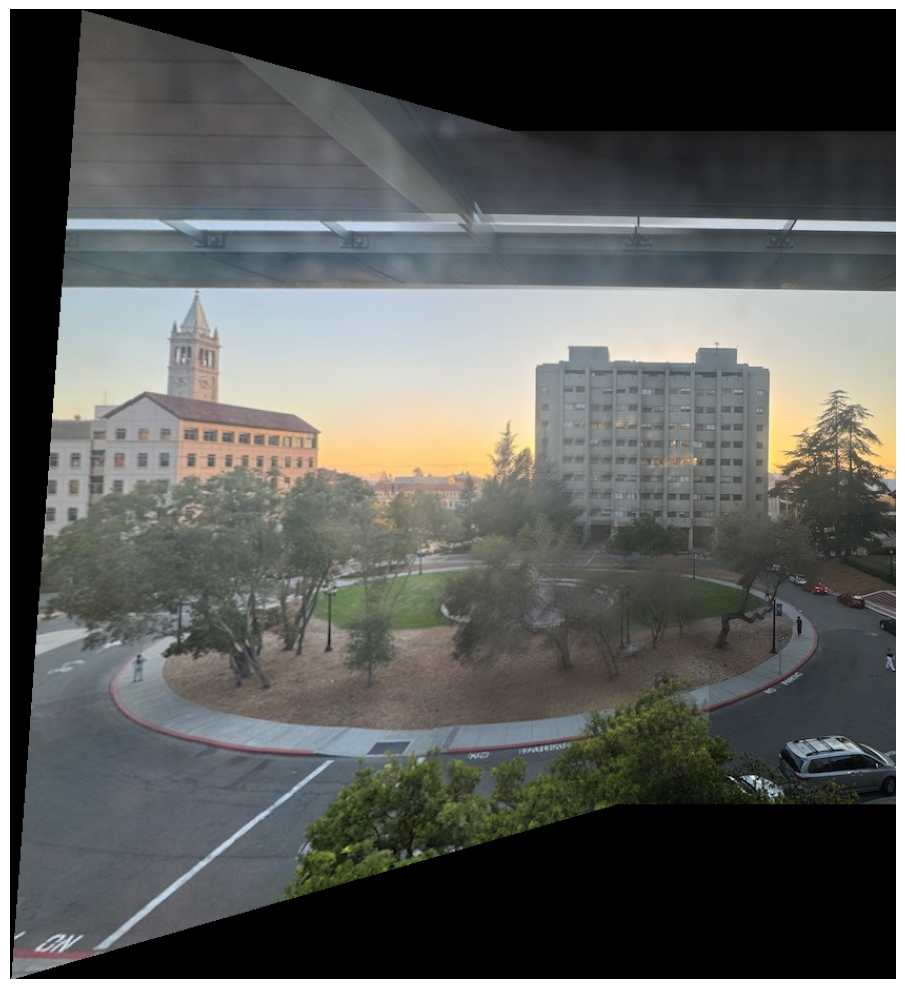

In [239]:

with open('../images/IMG_5832_IMG_5835.json', 'r') as f:
    correspondences = json.load(f)
    
mH = computeH(np.array(correspondences['im2Points']), np.array(correspondences['im1Points']))
alignment_result = align_images(image_list[0], image_list[2], mH)
final_mosaic = blend_images(alignment_result, blend_method='weighted')

# Display
plt.figure(figsize=(15, 10))
plt.imshow(final_mosaic)
plt.axis('off')
# plt.title('Stitched Mosaic with Weighted Blending')
plt.tight_layout()
plt.show()

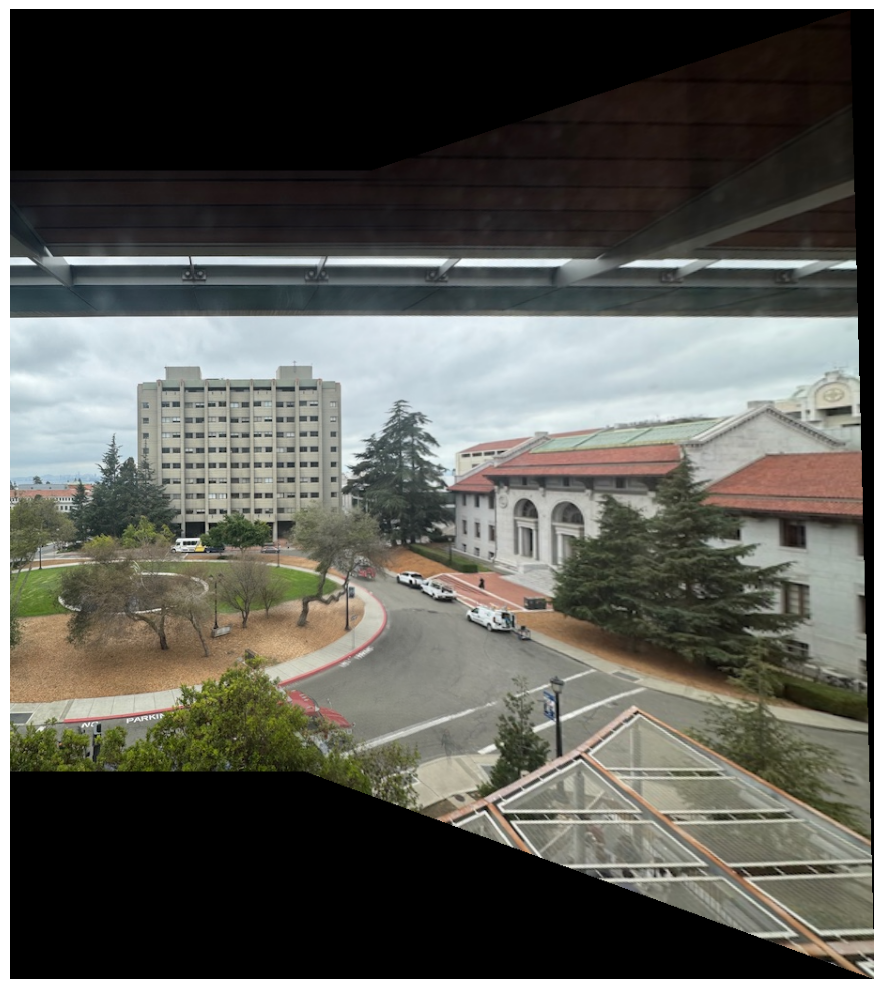

In [ ]:

with open('../images/evans2_corr.json', 'r') as f:
    evans2_correspondences = json.load(f)
    
evans2_org = np.rot90(skio.imread('../images/IMG_5846.jpg'), k=-1)
evans2_warp = np.rot90(skio.imread('../images/IMG_5851.jpg'), k=-1)

evans2H = computeH(np.array(evans2_correspondences['im2Points']), np.array(evans2_correspondences['im1Points']))
evans2_result = align_images(evans2_org, evans2_warp, evans2H)
evans2_mosaic = blend_images(evans2_result, blend_method='weighted')

# Display
plt.figure(figsize=(15, 10))
plt.imshow(evans2_mosaic)
plt.axis('off')
plt.tight_layout()
plt.show()

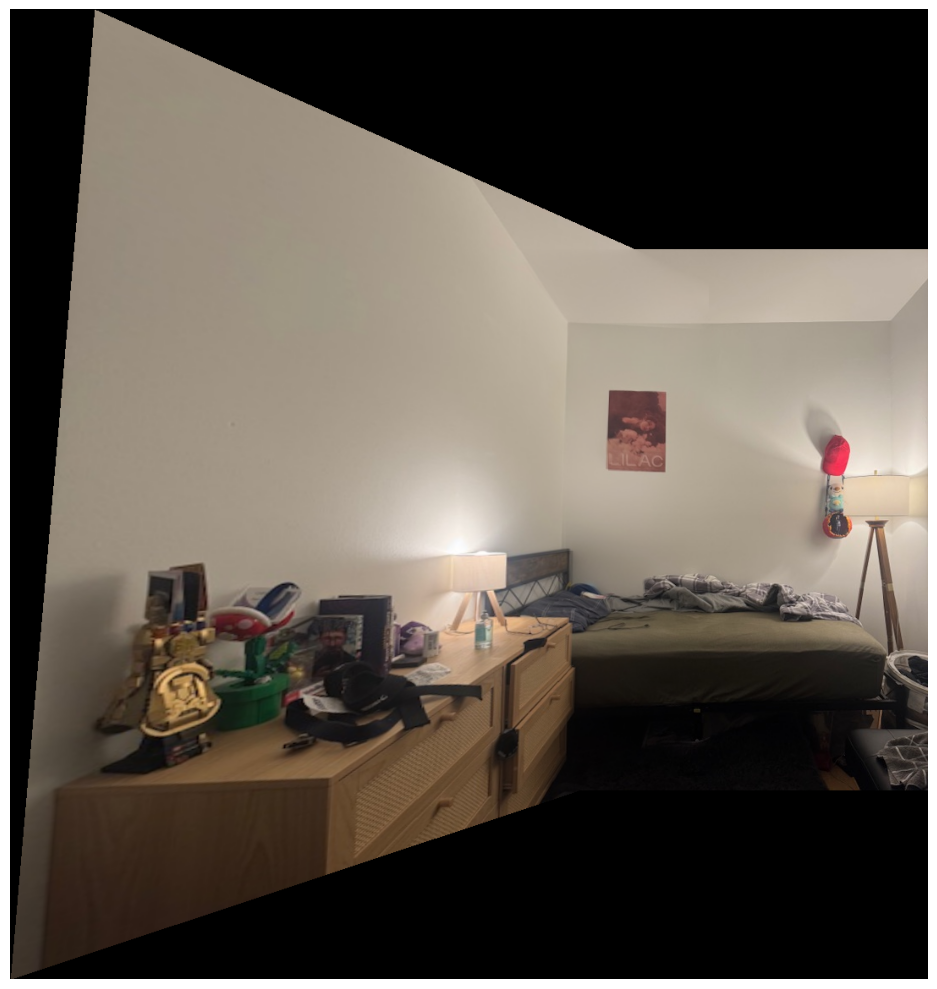

In [245]:

with open('../images/room_corr.json', 'r') as f:
    room_correspondences = json.load(f)
    
room_org = np.rot90(skio.imread('../images/IMG_5863.jpg'), k=-1)
room_warp = np.rot90(skio.imread('../images/IMG_5864.jpg'), k=-1)

roomH = computeH(np.array(room_correspondences['im2Points']), np.array(room_correspondences['im1Points']))
room_result = align_images(room_org, room_warp, roomH)
room_mosaic = blend_images(room_result, blend_method='weighted')

# Display
plt.figure(figsize=(15, 10))
plt.imshow(room_mosaic)
plt.axis('off')
plt.tight_layout()
plt.show()